In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import scipy.io as sci

import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

# Image

In [5]:
# Files path
colab = True
if colab:
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/MyDrive/'
else:
    path = 'Data/'

Mounted at /content/drive


In [6]:
# Load and preprocess images

# Samson
def load_samson(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Y_clean.mat')
    Y_clean = Y_file['Y_clean'].astype(float)

    A_file = sci.loadmat(path + 'A_true.mat')
    A_true = A_file['A_true']

    E_file = sci.loadmat(path + 'E.mat')
    E = E_file['E']

    # Image dimensions
    nCol, nRow = 95, 95
    n, m = 96, 96
    r_channels = 3
    n_bands = 156

    # Reflexive padding
    Y = np.zeros((n, m, n_bands))
    Y[:-1, :-1] = Y_clean
    Y[-1, :], Y[:, -1] = Y[0, :], Y[:, 0]

    A_gt = np.zeros((n, m, r_channels))
    A_gt[:-1, :-1] = A_true
    A_gt[-1, :], A_gt[:, -1] = A_gt[0, :], A_gt[:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(np.transpose(A_gt, (2,0,1)), dtype=torch.float32)
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(np.transpose(Y, (2,0,1)).reshape((n_bands, n*m)), dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Jasper
def load_jasper(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'jasperRidge2_R198.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end4.mat')
    E = gt_file['M']
    A_gt = gt_file['A']

    # Image dimensions
    r_channels = 4
    n_bands = 198
    n, m = 100, 100

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y, dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Urban
def load_urban(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Urban_R162.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end6_groundTruth.mat')
    E = gt_file['M']
    A_true = gt_file['A']

    # Image dimensions
    r_channels = 6
    n_bands = 162
    nCol, nRow = 307, 307
    n, m = 308, 308

    # Reflexive padding
    Y_b = np.zeros((n_bands,n,m))
    Y_b[:,:-1, :-1] = Y.reshape((n_bands,nCol,nRow))
    Y_b[:,-1, :], Y_b[:,:, -1] = Y_b[:,0,:], Y_b[:,:,0]

    A_gt = np.zeros((r_channels, n, m))
    A_gt[:,:-1, :-1] = A_true.reshape((r_channels,nCol,nRow))
    A_gt[:,-1, :], A_gt[:,:, -1] = A_gt[:,0, :], A_gt[:,:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y_b, dtype=torch.float32).reshape([n_bands,n*m])

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Plot images
def plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m):
    # Plot abundances
    print('Abundances:')
    plt.figure(figsize=(15,10))
    for i in range(r_channels):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(A_gt_tensor[i,:,:])
    plt.tight_layout()
    plt.show()

    print('Endmembers:')
    plt.plot(E_tensor)
    plt.show()

    print('Image:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow((Y_tensor).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

    print('E@A:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(torch.mm(E_tensor,
                           A_gt_tensor.view(r_channels, n*m)).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

In [7]:
#Data = load_samson(path)
#Data = load_jasper(path)
Data = load_urban(path)

r_channels = Data['r_channels']
n_bands = Data['n_bands']
n, m = Data['image_dimensions']
A_gt_tensor = Data['A_gt']
E_tensor = Data['E']
Y_tensor = Data['Y']

# Groud truth loss
nn.MSELoss()(torch.mm(E_tensor, A_gt_tensor.view(r_channels, n*m)), Y_tensor)

tensor(0.0054)

Abundances:


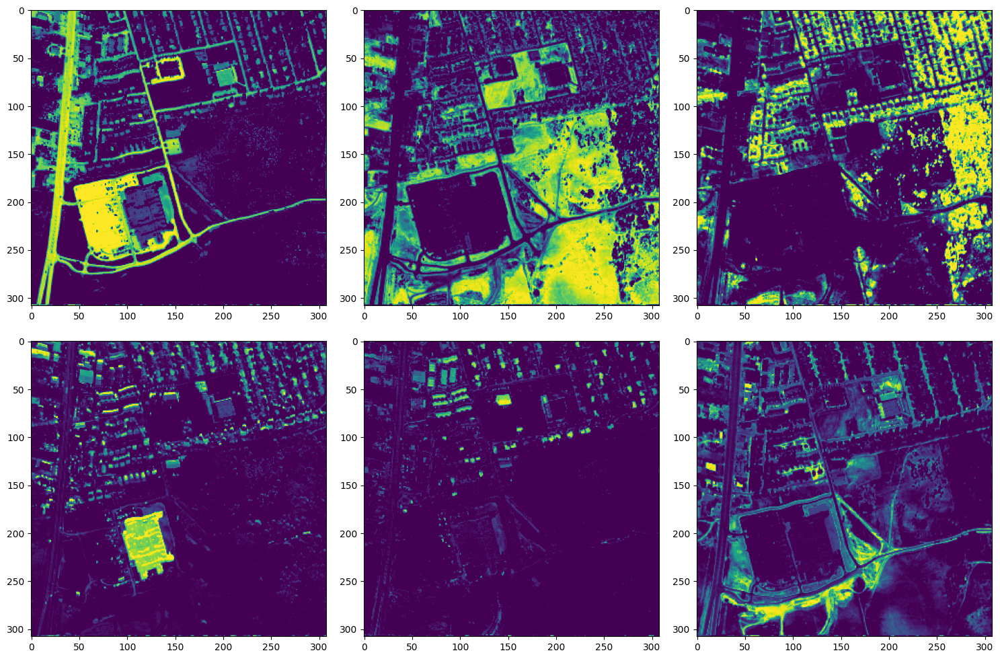

Endmembers:


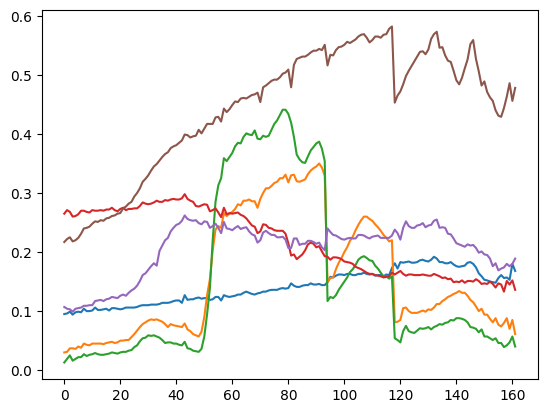

Image:


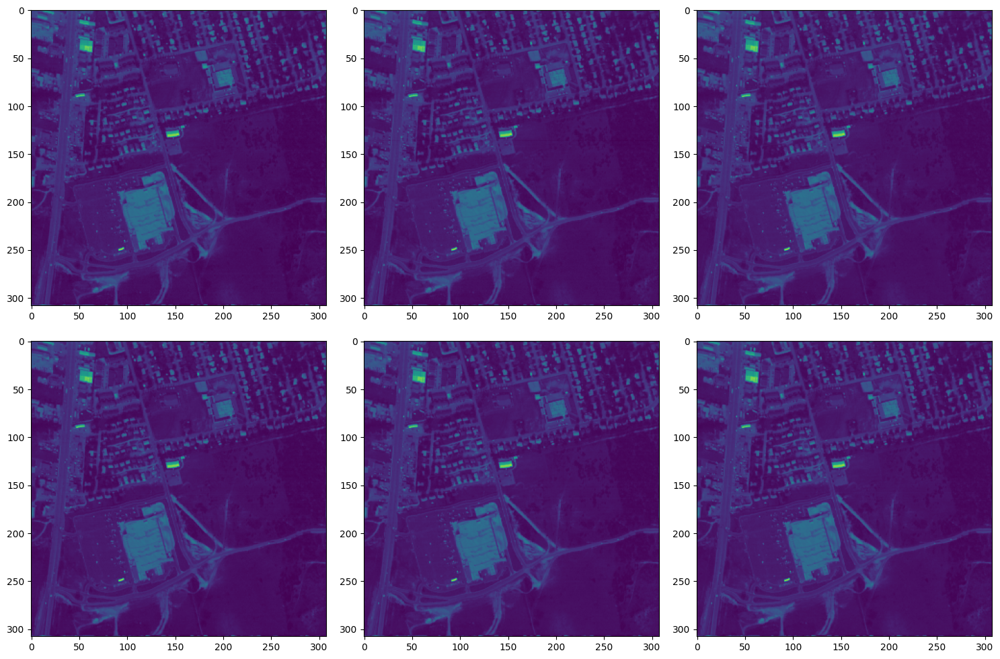

E@A:


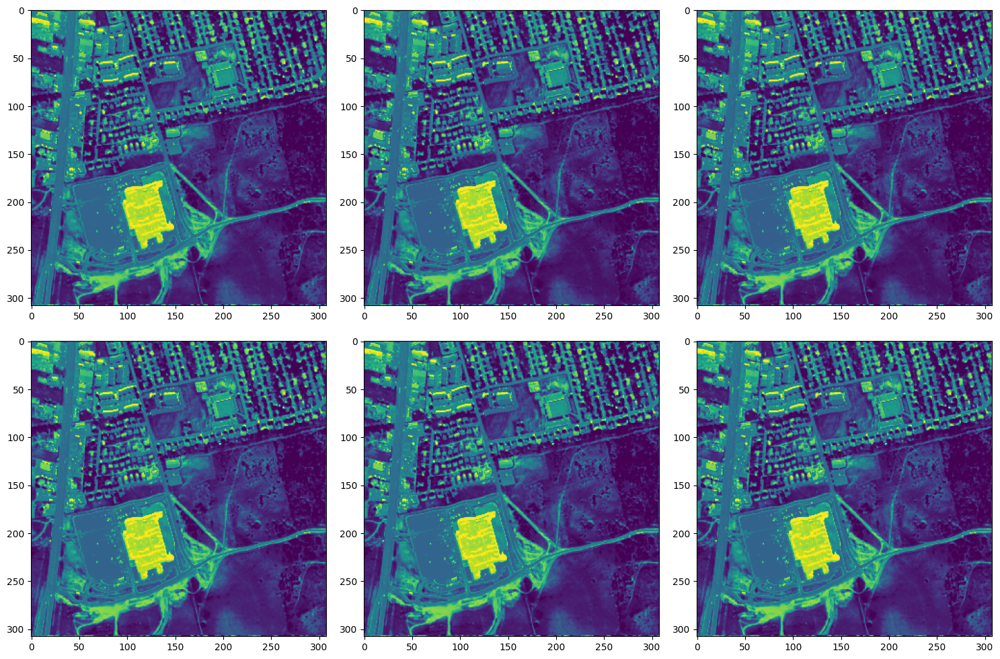

In [8]:
plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m)

# Noise

In [9]:
def add_noise(Y_tensor, snr):
    sigma = torch.sqrt(torch.mean(Y_tensor**2)/snr)
    noise = torch.normal(0,sigma,size=Y_tensor.shape, dtype=torch.float32)
    return Y_tensor + noise

Noisy image:


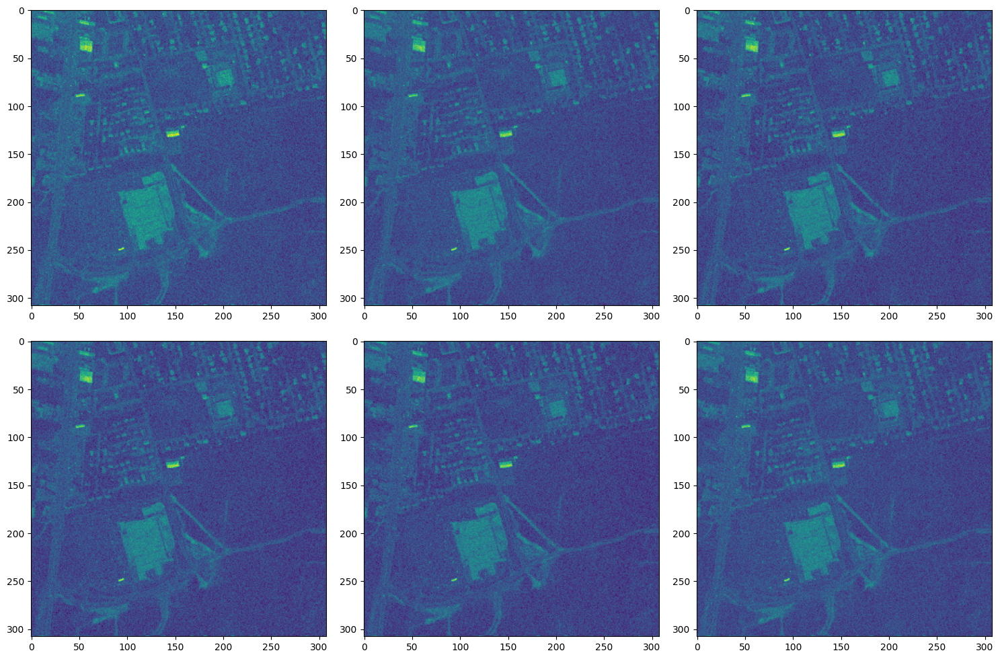

In [10]:
snr = 20
Y_noise = add_noise(Y_tensor, snr)

print('Noisy image:')
plt.figure(figsize=(15,10))
for i in range(6):
    ax = plt.subplot(2, 3, i+1)
    ax.imshow((Y_noise).reshape(n_bands,n,m)[i,:,:])
plt.tight_layout()
plt.show()

# Models

In [11]:
# Models
encoder_channels = [256,256]
decoder_channels = [256,256,r_channels]
skip_channels = 4

# Define the network architecture
class Undip_net_paper(nn.Module):
  def __init__(self):
    super(Undip_net_paper, self).__init__()

    self.encoder1 = nn.Sequential(nn.Conv2d(r_channels, encoder_channels[0], (3, 3),
                                            stride=(2, 2), padding_mode='reflect', padding=1, dilation=1), # (308,308) to (154,154)
                                  nn.BatchNorm2d(encoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )

    self.encoder2 = nn.Sequential(nn.Conv2d(encoder_channels[0], encoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(encoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (154,154)
    )

    self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')


    self.skip = nn.Sequential(nn.Conv2d(r_channels, skip_channels, (1, 1), stride=(1, 1),
                                        padding=0, dilation=1),
                              nn.BatchNorm2d(skip_channels),
                              nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )



    self.decoder1 = nn.Sequential(nn.BatchNorm2d(encoder_channels[1]+skip_channels),
                                  nn.Conv2d(encoder_channels[1]+skip_channels, decoder_channels[0],
                                            (3, 3), stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1)
    )



    self.decoder2 = nn.Sequential(nn.Conv2d(decoder_channels[0], decoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (77,77)
    )

    self.decoder3 = nn.Sequential(nn.Conv2d(decoder_channels[1], decoder_channels[2], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.Softmax(dim=1)
    )


  def forward(self, input):


    current_feature = self.encoder1(input)
    current_feature = self.encoder2(current_feature)
    current_feature = self.upsample(current_feature)

    current_skip_output = self.skip(input)

    current_feature = torch.cat((current_feature,current_skip_output), dim=1)


    current_feature = self.decoder1(current_feature)
    current_feature = self.decoder2(current_feature)
    output = self.decoder3(current_feature)


    return output

In [12]:
# Training algorithm
def train(model, input, E_tensor, Y_tensor, Y_noise, epochs=3000, lr=0.001, varying_noise_snr=None):

    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    model = model.to(device)
    input = input.to(device)
    criterion = criterion.to(device)
    E_tensor = E_tensor.to(device)
    Y_tensor = Y_tensor.to(device)
    Y_noise = Y_noise.to(device)

    history = {'losses': [],
               'RMSE': [],
               'outputs': torch.zeros([epochs, 1, r_channels, n, m])}

    model.eval() if optimizer is None else model.train()
    for epoch in range(1, epochs + 1):

        # Different noise at every epoch
        if varying_noise_snr:
            Y_noise = add_noise(Y_tensor, varying_noise_snr)

        model.train()
        train_loss = 0.0

        optimizer.zero_grad()

        output = model(input)

        loss = criterion(torch.mm(E_tensor, output.view(r_channels, n*m)), Y_noise)

        print('Epoch {}: '.format(epoch), loss.item())
        history['losses'].append(loss.item())
        history['RMSE'].append(nn.MSELoss()(torch.mm(E_tensor, output.view(r_channels, n*m)),
                                            Y_tensor).item())
        history['outputs'][epoch-1] = output.detach()

        loss.backward()
        optimizer.step()

    return output, history

# Training

In [13]:
Undip_model = Undip_net_paper()
lr = 0.001
epochs = 1000
snr = 50

In [14]:
# Initialisation of A
A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)

In [15]:
# Noisy Y
Y_noise = add_noise(Y_tensor, snr)
#Y_noise = Y_tensor # no noise

In [16]:
# Training
output, history = train(Undip_model,A, E_tensor, Y_tensor, Y_noise, lr=lr, epochs=epochs)

Epoch 1:  0.011487666517496109
Epoch 2:  0.009716654196381569
Epoch 3:  0.009618042968213558
Epoch 4:  0.009212786331772804
Epoch 5:  0.008698143064975739
Epoch 6:  0.007917932234704494
Epoch 7:  0.007644431199878454
Epoch 8:  0.00810883566737175
Epoch 9:  0.006919288542121649
Epoch 10:  0.00706480722874403
Epoch 11:  0.006590898614376783
Epoch 12:  0.006218933966010809
Epoch 13:  0.006135131232440472
Epoch 14:  0.00598498247563839
Epoch 15:  0.0057335225865244865
Epoch 16:  0.005567530170083046
Epoch 17:  0.005449147429317236
Epoch 18:  0.005289290100336075
Epoch 19:  0.005170695949345827
Epoch 20:  0.005092855542898178
Epoch 21:  0.005074901040643454
Epoch 22:  0.004959960468113422
Epoch 23:  0.004780755378305912
Epoch 24:  0.004717440810054541
Epoch 25:  0.004657371900975704
Epoch 26:  0.004558056127279997
Epoch 27:  0.004471828695386648
Epoch 28:  0.004427288193255663
Epoch 29:  0.004347516223788261
Epoch 30:  0.004261157941073179
Epoch 31:  0.00421480555087328
Epoch 32:  0.0041507

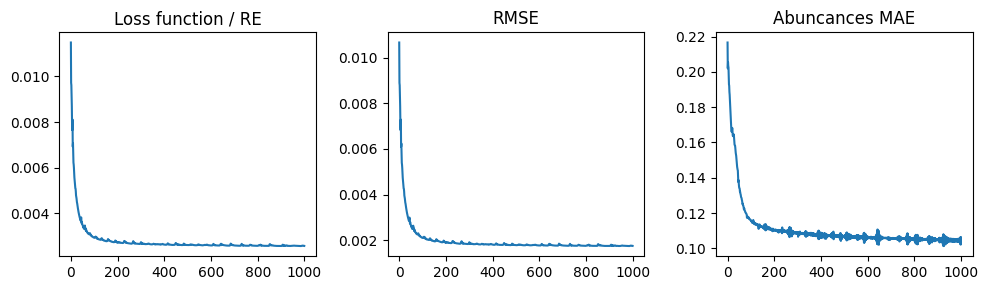

In [17]:
def plot_history(history, A_gt_tensor):
    plt.figure(figsize=(10,3))
    plt.subplot(1,3,1)
    plt.title('Loss function / RE')
    plt.plot(history['losses'])
    plt.subplot(1,3,2)
    plt.title('RMSE')
    plt.plot(history['RMSE'])
    plt.subplot(1,3,3)
    plt.title('Abuncances MAE')
    plt.plot([nn.L1Loss()(o, A_gt_tensor.view([1,r_channels,n,m])) for o in history['outputs']])
    plt.tight_layout()
    plt.show()

plot_history(history, A_gt_tensor)

In [21]:
# Final metrics
def evaluate(A, A_gt_tensor, E_tensor, Y_tensor, Y_noise):
    MAE = nn.L1Loss()(A.to(torch.device('cpu')), A_gt_tensor.view([1,r_channels,n,m])).item()
    RE = nn.MSELoss()(torch.mm(E_tensor, A.to(torch.device('cpu')).view(r_channels, n*m)), Y_noise).item()
    RMSE = nn.MSELoss()(torch.mm(E_tensor, A.to(torch.device('cpu')).view(r_channels, n*m)), Y_tensor).item()
    return MAE, RE, RMSE

evaluate(output, A_gt_tensor, E_tensor, Y_tensor, Y_noise)

(0.1062389686703682, 0.0025661822874099016, 0.0017518625827506185)

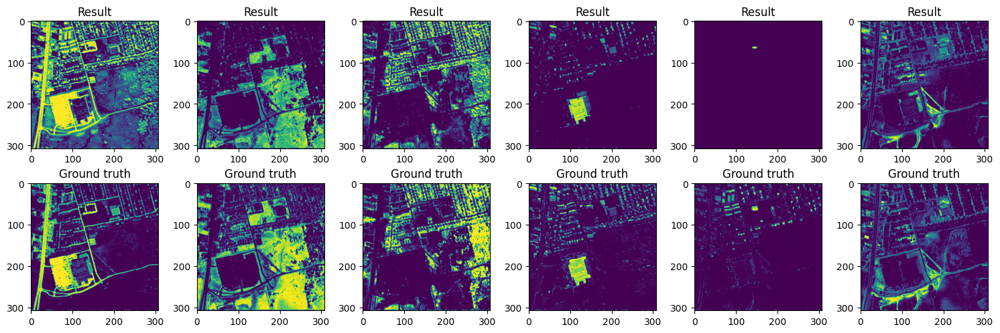

In [23]:
# View results
def view_results(r_channels, A, A_gt_tensor):
    plt.figure(figsize=(15,5))
    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1)
        im = A.cpu().detach()[0, i,:,:]
        ax.imshow(im)
        plt.title('Result')

    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1+r_channels)
        im = A_gt_tensor.view([1,r_channels,n,m])[0,i,:,:]
        ax.imshow(im)
        plt.title('Ground truth')

    plt.tight_layout()
    plt.show()

view_results(r_channels, output, A_gt_tensor)

Epoch 1:  0.01481681689620018
Epoch 2:  0.011250604875385761
Epoch 3:  0.010946876369416714
Epoch 4:  0.011138682253658772
Epoch 5:  0.010766565799713135
Epoch 6:  0.010235713794827461
Epoch 7:  0.009956266731023788
Epoch 8:  0.009392659179866314
Epoch 9:  0.009073438122868538
Epoch 10:  0.008983058854937553
Epoch 11:  0.008516092784702778
Epoch 12:  0.008177367970347404
Epoch 13:  0.007891654036939144
Epoch 14:  0.0077477251179516315
Epoch 15:  0.007416116073727608
Epoch 16:  0.007257469464093447
Epoch 17:  0.007087057456374168
Epoch 18:  0.006892841774970293
Epoch 19:  0.006769993808120489
Epoch 20:  0.006646983325481415
Epoch 21:  0.006495393346995115
Epoch 22:  0.006368027068674564
Epoch 23:  0.006294277962297201
Epoch 24:  0.006174146663397551
Epoch 25:  0.006084012798964977
Epoch 26:  0.006028151139616966
Epoch 27:  0.005942367948591709
Epoch 28:  0.00587001396343112
Epoch 29:  0.005815777461975813
Epoch 30:  0.0057547627948224545
Epoch 31:  0.005700934678316116
Epoch 32:  0.0056

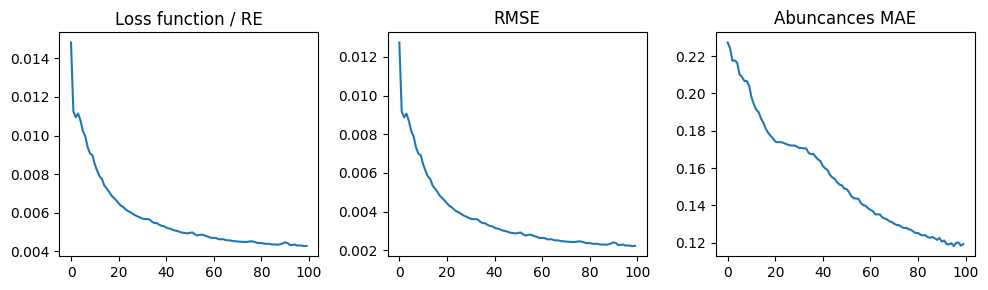

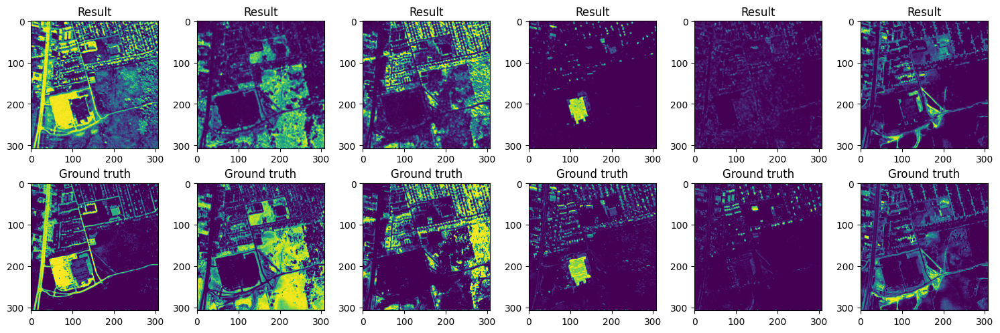

Epoch 1:  0.013724175281822681
Epoch 2:  0.011508229188621044
Epoch 3:  0.010697685182094574
Epoch 4:  0.010383600369095802
Epoch 5:  0.010205160826444626
Epoch 6:  0.010042129084467888
Epoch 7:  0.00989061314612627
Epoch 8:  0.009701143950223923
Epoch 9:  0.009498368948698044
Epoch 10:  0.009276952594518661
Epoch 11:  0.009064443409442902
Epoch 12:  0.008882985450327396
Epoch 13:  0.008662799373269081
Epoch 14:  0.008433629758656025
Epoch 15:  0.008167245425283909
Epoch 16:  0.00789189524948597
Epoch 17:  0.007638303562998772
Epoch 18:  0.0074220639653503895
Epoch 19:  0.007257435005158186
Epoch 20:  0.007035388145595789
Epoch 21:  0.006765120662748814
Epoch 22:  0.006623788271099329
Epoch 23:  0.006433345843106508
Epoch 24:  0.006309397518634796
Epoch 25:  0.006182704586535692
Epoch 26:  0.006075145211070776
Epoch 27:  0.0059661162085831165
Epoch 28:  0.005872747860848904
Epoch 29:  0.005786421708762646
Epoch 30:  0.0057024769484996796
Epoch 31:  0.005629934370517731
Epoch 32:  0.005

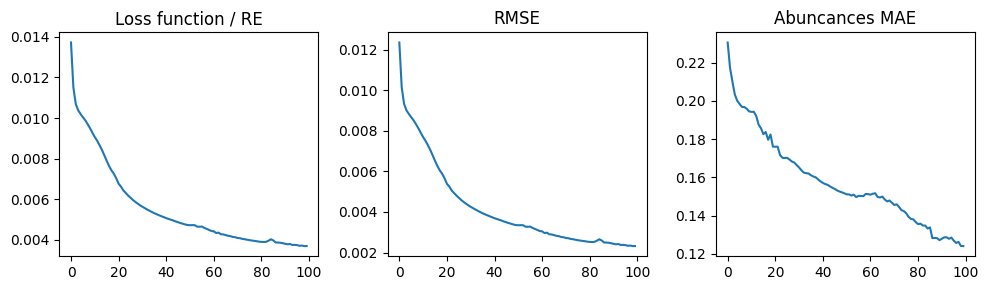

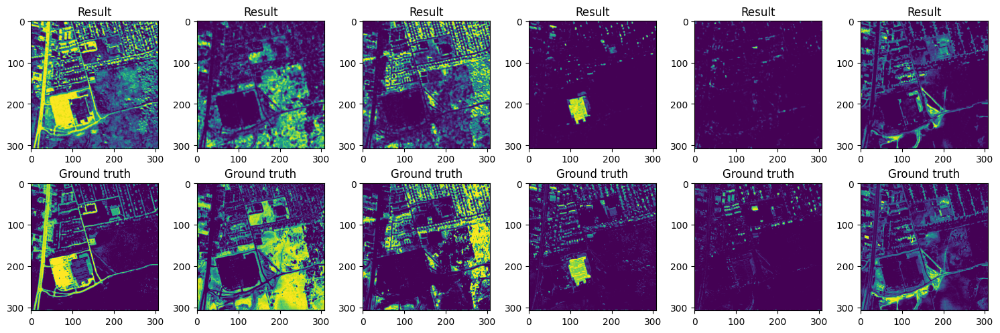

Epoch 1:  0.013445834629237652
Epoch 2:  0.010871726088225842
Epoch 3:  0.010220473632216454
Epoch 4:  0.009880087338387966
Epoch 5:  0.009613334201276302
Epoch 6:  0.009363073855638504
Epoch 7:  0.009168962016701698
Epoch 8:  0.008984141983091831
Epoch 9:  0.008782115764915943
Epoch 10:  0.008570117875933647
Epoch 11:  0.008338104002177715
Epoch 12:  0.008077424019575119
Epoch 13:  0.007808176800608635
Epoch 14:  0.007524274289608002
Epoch 15:  0.0072364769876003265
Epoch 16:  0.006968564819544554
Epoch 17:  0.006728014908730984
Epoch 18:  0.006533807143568993
Epoch 19:  0.0063743581995368
Epoch 20:  0.006202484015375376
Epoch 21:  0.006033041980117559
Epoch 22:  0.005864929407835007
Epoch 23:  0.005720240063965321
Epoch 24:  0.005597536917775869
Epoch 25:  0.005479215178638697
Epoch 26:  0.0053723715245723724
Epoch 27:  0.005272165406495333
Epoch 28:  0.005178961902856827
Epoch 29:  0.005091225728392601
Epoch 30:  0.005006490740925074
Epoch 31:  0.004929144401103258
Epoch 32:  0.0048

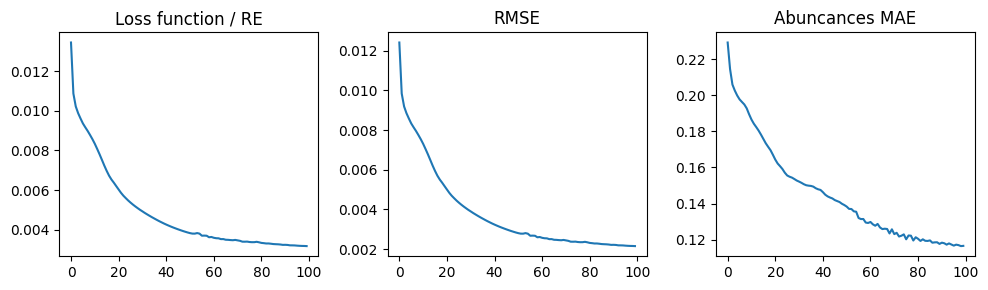

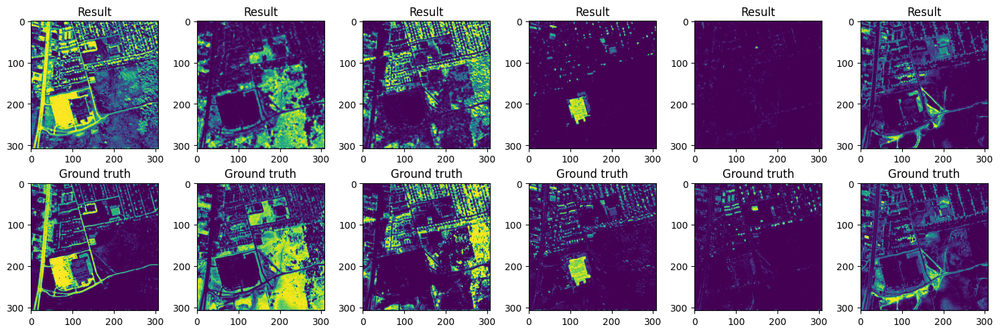

Epoch 1:  0.013223327696323395
Epoch 2:  0.011149434372782707
Epoch 3:  0.010197360999882221
Epoch 4:  0.009796994738280773
Epoch 5:  0.009471414610743523
Epoch 6:  0.009145420044660568
Epoch 7:  0.008784417994320393
Epoch 8:  0.008447657339274883
Epoch 9:  0.008182908408343792
Epoch 10:  0.007918579503893852
Epoch 11:  0.007616390939801931
Epoch 12:  0.0073406882584095
Epoch 13:  0.007063161116093397
Epoch 14:  0.006788905709981918
Epoch 15:  0.006545687559992075
Epoch 16:  0.006347213871777058
Epoch 17:  0.006181757897138596
Epoch 18:  0.006016143132001162
Epoch 19:  0.005861369427293539
Epoch 20:  0.005721074994653463
Epoch 21:  0.0055715786293148994
Epoch 22:  0.005434062331914902
Epoch 23:  0.005327350925654173
Epoch 24:  0.005227234680205584
Epoch 25:  0.005133453756570816
Epoch 26:  0.0050447797402739525
Epoch 27:  0.004954498261213303
Epoch 28:  0.0048667062073946
Epoch 29:  0.00478591350838542
Epoch 30:  0.004706673789769411
Epoch 31:  0.00463020708411932
Epoch 32:  0.00456190

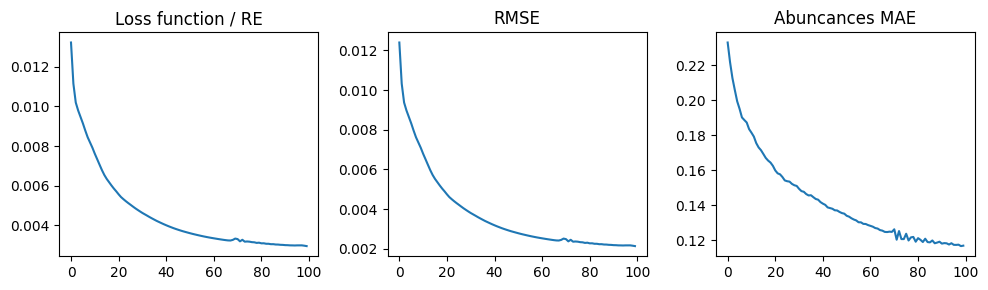

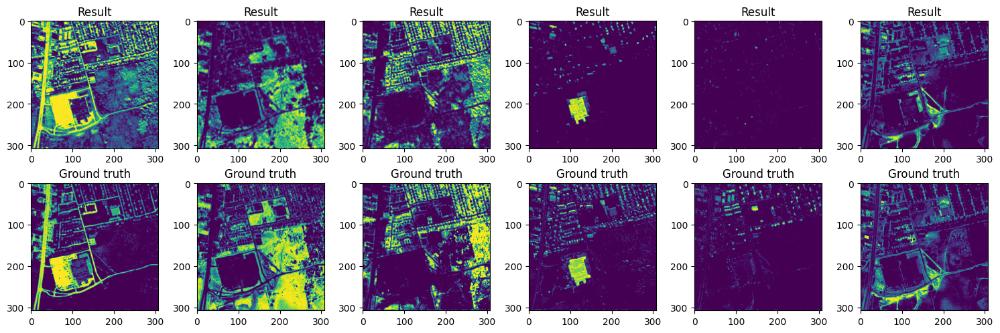

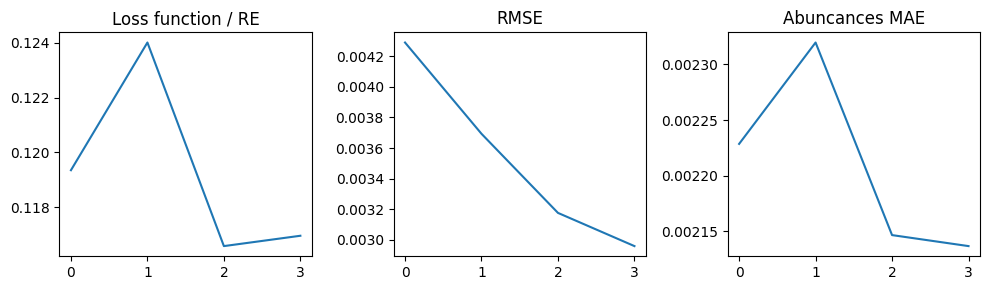

In [27]:
# Evaluate at different levels of noise

# Parameters
Undip_model = Undip_net_paper()
lr = 0.001
epochs = 100

def evaluate_model(snrs=[20,30,40,50], plot_results=True):
    REs = []
    RMSEs = []
    MAEs = []
    for snr in snrs:
        A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)
        Y_noise = add_noise(Y_tensor, snr)
        output, history = train(Undip_model,A, E_tensor, Y_tensor, Y_noise, lr=lr, epochs=epochs)

        if plot_results:
            plot_history(history, A_gt_tensor)
            view_results(r_channels, output, A_gt_tensor)

        RE, RMSE, MAE = evaluate(output, A_gt_tensor, E_tensor, Y_tensor, Y_noise)
        REs.append(RE)
        RMSEs.append(RMSE)
        MAEs.append(MAE)

    return REs, RMSEs, MAEs

def plot_evaluation(evaluation):
    plt.figure(figsize=(10,3))
    REs, RMSes, MAEs = evaluation
    plt.subplot(1,3,1)
    plt.title('Loss function / RE')
    plt.plot(REs)
    plt.subplot(1,3,2)
    plt.title('RMSE')
    plt.plot(RMSes)
    plt.subplot(1,3,3)
    plt.title('Abuncances MAE')
    plt.plot(MAEs)
    plt.tight_layout()
    plt.show()

plot_evaluation(evaluate_model())

# Varying noise at each epoch

In [ ]:
Undip_model = Undip_net_paper()
lr = 0.001
epochs = 1000
snr = 20
A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)
Y_noise = add_noise(Y_tensor.cpu(), snr)

output, history = train(Undip_model,A, E_tensor, Y_tensor,
                        Y_noise, lr=lr, epochs=epochs, varying_noise_snr=snr)

plot_history(history, A_gt_tensor)
view_results(r_channels, output, A_gt_tensor)